<a href="https://colab.research.google.com/github/Saketkr06/Machine-learning-projects/blob/main/Cats_vs_Dogs_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
#!unzip kagglecatsanddogs_5340.zip

In [3]:
!pip install keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from tensorflow.keras.utils import load_img
warnings.filterwarnings('ignore')

In [7]:
!wget  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-05-27 16:11:31--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.119.184.235, 2600:1407:7800:2ab::317f, 2600:1407:7800:295::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.119.184.235|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip.1’

kagglecatsanddogs_5 100%[===================>] 786.67M   112MB/s    in 6.7s    

2023-05-27 16:11:37 (118 MB/s) - ‘kagglecatsanddogs_5340.zip.1’ saved [824887076/824887076]



In [11]:
input_path=[]
label=[]

for class_name in os.listdir('PetImages'):
  for path in os.listdir('PetImages/'+class_name):
    if class_name=='Cat':
      label.append(0)
    else:
      label.append(1)

    input_path.append(os.path.join('PetImages',class_name,path))

print(input_path[0],label[0])

PetImages/Dog/3635.jpg 1


In [12]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/11865.jpg,1
1,PetImages/Dog/11901.jpg,1
2,PetImages/Dog/4439.jpg,1
3,PetImages/Cat/5134.jpg,0
4,PetImages/Dog/3.jpg,1


In [13]:
for i in df['images']:
  if '.jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [14]:
import PIL
l=[]
for image in df['images']:
  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)

In [15]:
l

['PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Dog/11702.jpg',
 'PetImages/Cat/Thumbs.db']

In [16]:
#delete db files
df=df[df['images']!='PetImages/Dog/Thumbs.db']
df=df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']

In [17]:
len(df)

24998

EDA

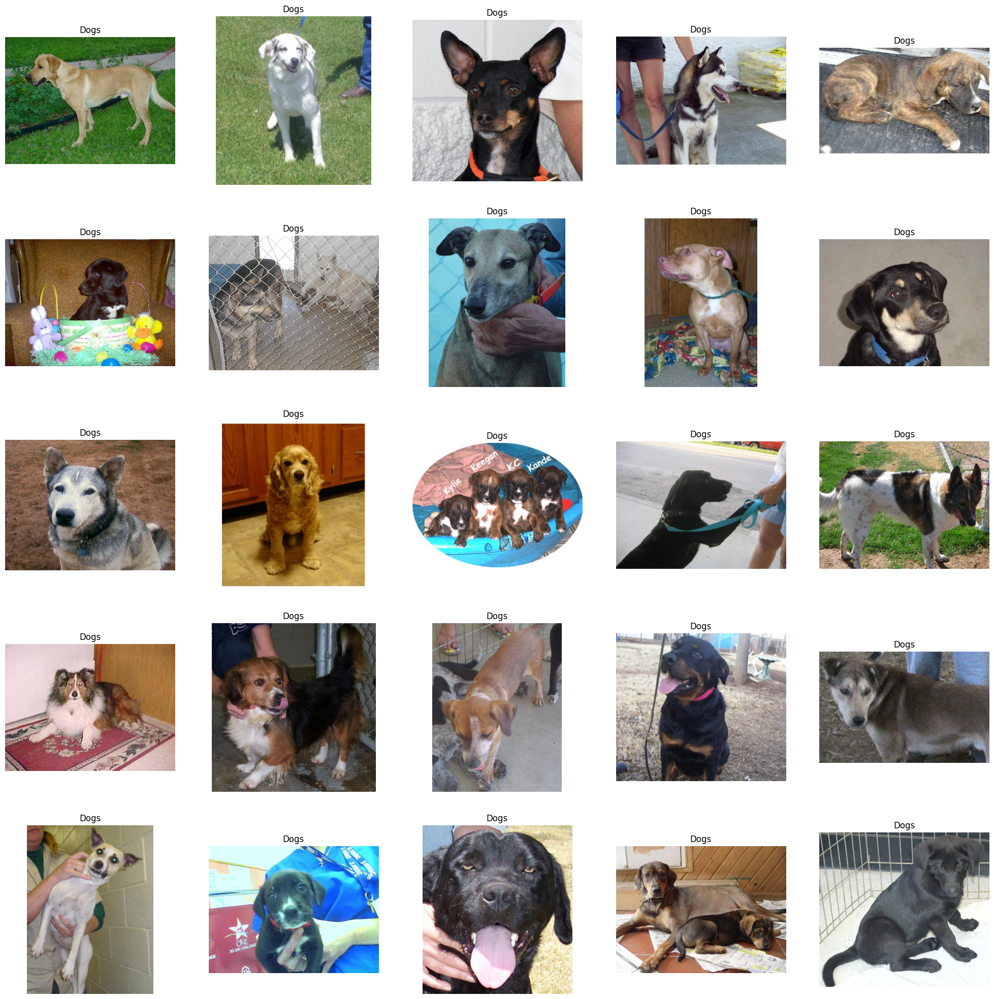

In [18]:
#to display grid of images
plt.figure(figsize=(25,25))
temp=df[df['label']==1]['images']
start=random.randint(0,len(temp))
files=temp[start:start+25]

for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

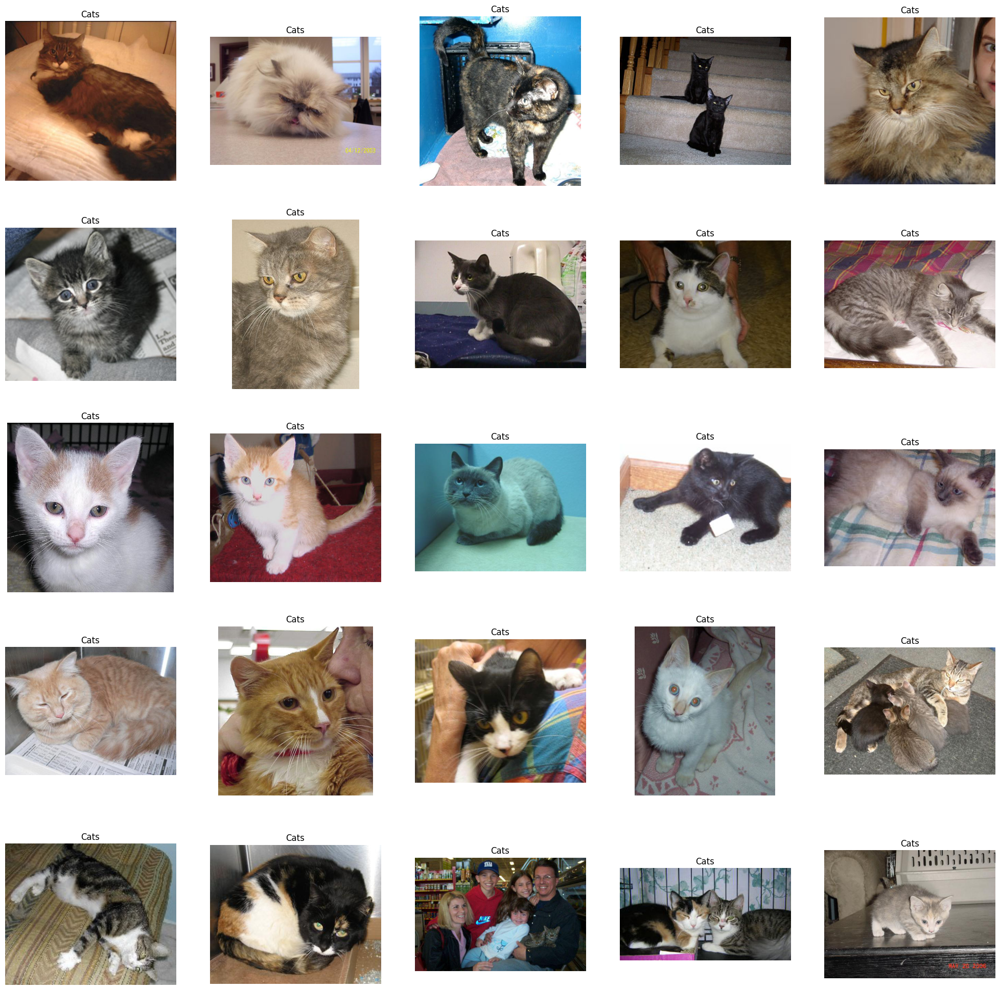

In [19]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: ylabel='count'>

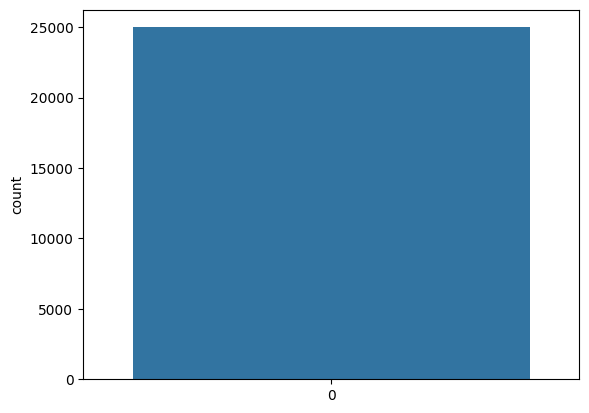

In [20]:
import seaborn as sns
sns.countplot(df['label'])

In [21]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages/Dog/11865.jpg,1
1,PetImages/Dog/11901.jpg,1
2,PetImages/Dog/4439.jpg,1
3,PetImages/Cat/5134.jpg,0
4,PetImages/Dog/3.jpg,1


In [22]:
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2,random_state=42)

In [23]:
from keras.preprocessing.image import ImageDataGenerator

In [24]:
train_generator=ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


val_generator=ImageDataGenerator(rescale=1./255)
train_iterator=train_generator.flow_from_dataframe(
    train,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator=val_generator.flow_from_dataframe(
    test,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [25]:
from keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D,Flatten,Dense

model = Sequential([
            Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
            MaxPooling2D((2,2)),
            Conv2D(32, (3,3), activation='relu'),
            MaxPooling2D((2,2)),
            Conv2D(64, (3,3), activation='relu'),
            MaxPooling2D((2,2)),
            Flatten(),
            Dense(512, activation='relu'),
            Dense(1, activation='sigmoid')
]) 

In [26]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [27]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 154s 4s/step - loss: 0.7367 - accuracy: 0.5584 - val_loss: 0.6500 - val_accuracy: 0.6188
Epoch 2/10
40/40 [==============================] - 141s 4s/step - loss: 0.6218 - accuracy: 0.6591 - val_loss: 0.5781 - val_accuracy: 0.6988
Epoch 3/10
40/40 [==============================] - 146s 4s/step - loss: 0.5809 - accuracy: 0.6955 - val_loss: 0.5519 - val_accuracy: 0.7156
Epoch 4/10
40/40 [==============================] - 141s 4s/step - loss: 0.5576 - accuracy: 0.7155 - val_loss: 0.5086 - val_accuracy: 0.7472
Epoch 5/10
40/40 [==============================] - 141s 4s/step - loss: 0.5384 - accuracy: 0.7275 - val_loss: 0.4922 - val_accuracy: 0.7552
Epoch 6/10
40/40 [==============================] - 141s 4s/step - loss: 0.5220 - accuracy: 0.7365 - val_loss: 0.4832 - val_accuracy: 0.7664
Epoch 7/10
40/40 [==============================] - 142s 4s/step - loss: 0.5099 - accuracy: 0.7493 - val_loss: 0.5002 - val_accuracy: 0.7464
Epoch 8/10
40

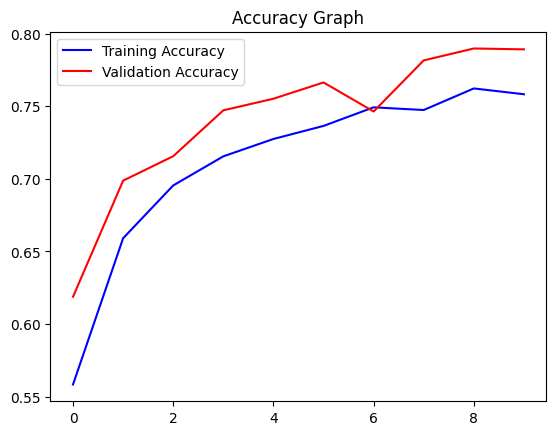

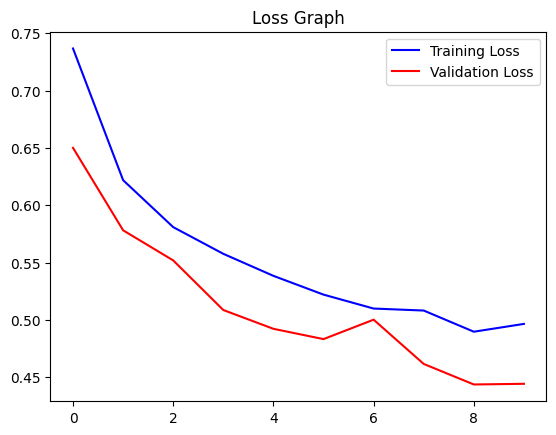

In [28]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

Test with Real Image

In [30]:
image_path='/content/Dog_Breeds.jpg'
img=load_img(image_path,target_size=(128,128))
img=np.array(img)
img=img/255.0
img=img.reshape(1,128,128,3)
pred=model.predict(img)
if pred[0]>0.5:
  label="Dog"
else:
  label='Cat'
print(label)

1/1 [==============================] - 0s 19ms/step
Dog
